## **Loading Libraries & Other Necessary Functions**

In [1]:
# Import OS libraries
import os
import itertools

# Data handling tools
import cv2
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns
from tqdm import tqdm
import cv2
import os
import imutils
import tensorflow as tf
import keras


In [2]:
import matplotlib.image as mpimg
%matplotlib inline
import random
from IPython.display import Image

In [3]:
from google.colab import files
from io import BytesIO
# Display images.
from IPython.display import display
from PIL import ImageEnhance
from PIL import Image

In [4]:
!pip install Pillow

In [5]:

from glob import glob
from tensorflow.keras.models import Model

from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix , classification_report

from tensorflow.keras.models import Sequential
from tensorflow.keras.preprocessing.image import ImageDataGenerator

from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,  BatchNormalization, Activation, Dropout
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.optimizers import Adam , Adamax
from tensorflow.keras import regularizers
from tensorflow.keras.layers import Dense

In [6]:
import torch
import torchvision
from torchvision import datasets, transforms
import cv2

**MobileNetV2 Related Info**

In [7]:
inception = tf.keras.applications.MobileNetV2(include_top=False, weights='imagenet', input_shape=(224, 224, 3))

9406464/9406464 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [8]:
for layer in inception.layers:
   layer.trainable=False

In [9]:
import os
import shutil

In [10]:
inception.summary()

Model: "mobilenetv2_1.00_224"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,257,984 (8.61 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
for layer in inception.layers:
    print(layer.name, layer.trainable)

input_layer False
Conv1 False
bn_Conv1 False
Conv1_relu False
expanded_conv_depthwise False
expanded_conv_depthwise_BN False
expanded_conv_depthwise_relu False
expanded_conv_project False
expanded_conv_project_BN False
block_1_expand False
block_1_expand_BN False
block_1_expand_relu False
block_1_pad False
block_1_depthwise False
block_1_depthwise_BN False
block_1_depthwise_relu False
block_1_project False
block_1_project_BN False
block_2_expand False
block_2_expand_BN False
block_2_expand_relu False
block_2_depthwise False
block_2_depthwise_BN False
block_2_depthwise_relu False
block_2_project False
block_2_project_BN False
block_2_add False
block_3_expand False
block_3_expand_BN False
block_3_expand_relu False
block_3_pad False
block_3_depthwise False
block_3_depthwise_BN False
block_3_depthwise_relu False
block_3_project False
block_3_project_BN False
block_4_expand False
block_4_expand_BN False
block_4_expand_relu False
block_4_depthwise False
block_4_depthwise_BN False
block_4_dep

**Mounting Drive**

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**Loading Training & Testing Sets**

In [ ]:
test_set = '/content/drive/MyDrive/MRI data Ashif_zahin/Testing'
train_set='/content/drive/MyDrive/MRI data Ashif_zahin/Training'

In [12]:
test_set = '/content/drive/MyDrive/Dataset/Testing'
train_set='/content/drive/MyDrive/Dataset/Training'

In [13]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

In [14]:
def get_folder(test_folder):
    plt.figure(figsize=(20,20))
    for i in range(3):
        file = random.choice(os.listdir(test_folder))
        image_path= os.path.join(test_folder, file)
        img=mpimg.imread(image_path)
        ax=plt.subplot(3,3,i+1)
        ax.title.set_text(file)
        plt.imshow(img)

**Dont run this line of codes**

Text(0.5, 1.0, 'GLioma')

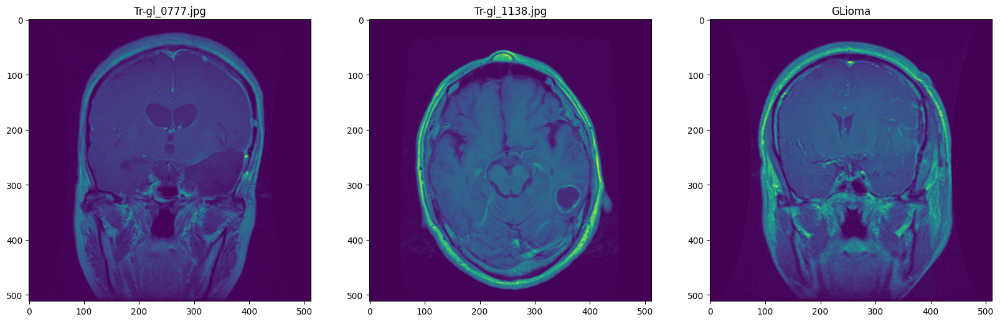

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/glioma")
plt.title('GLioma')

Text(0.5, 1.0, 'Meningioma')

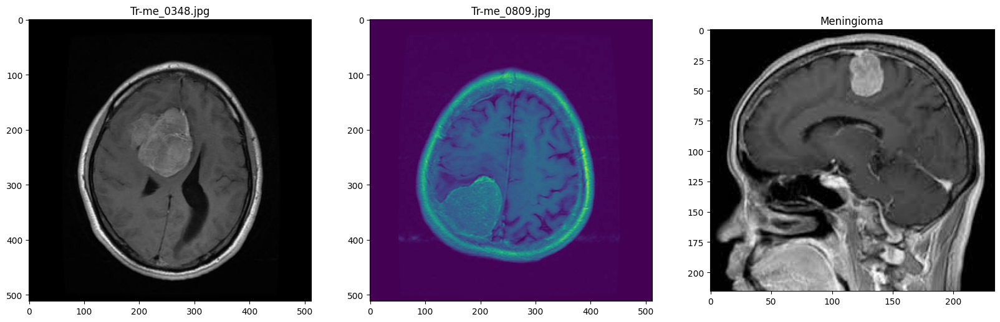

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/meningioma")
plt.title('Meningioma')

Text(0.5, 1.0, 'No Tumor')

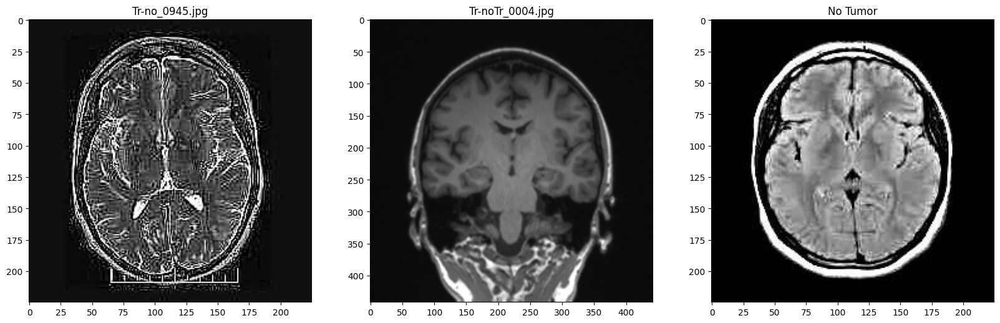

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/notumor")
plt.title('No Tumor')

Text(0.5, 1.0, 'Pituitary')

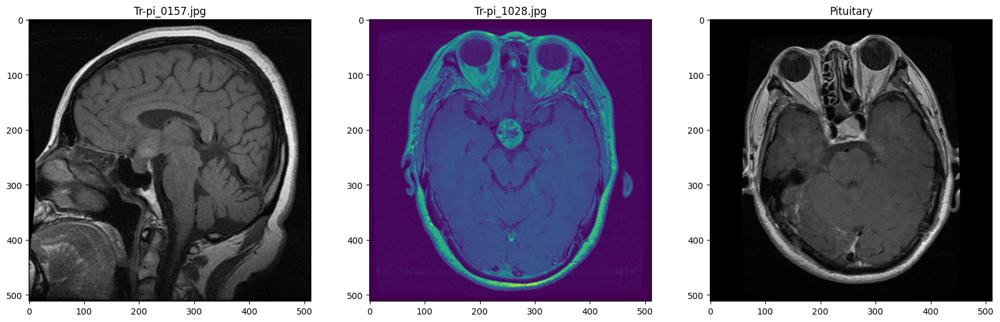

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Training/pituitary")
plt.title('Pituitary')

Text(0.5, 1.0, 'GLioma')

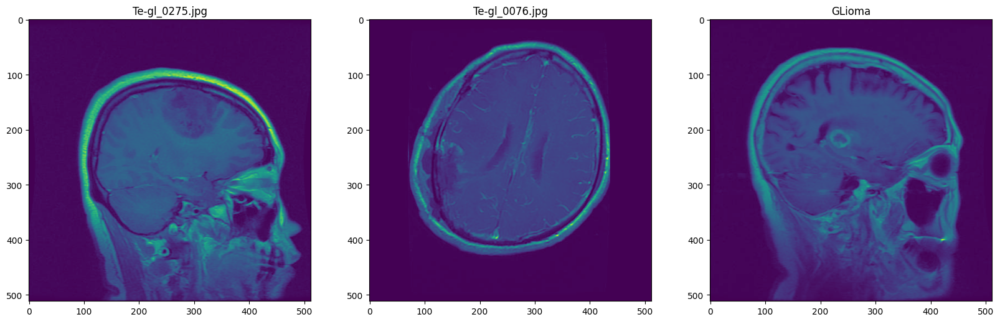

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/glioma")
plt.title('GLioma')

Text(0.5, 1.0, 'Meningioma')

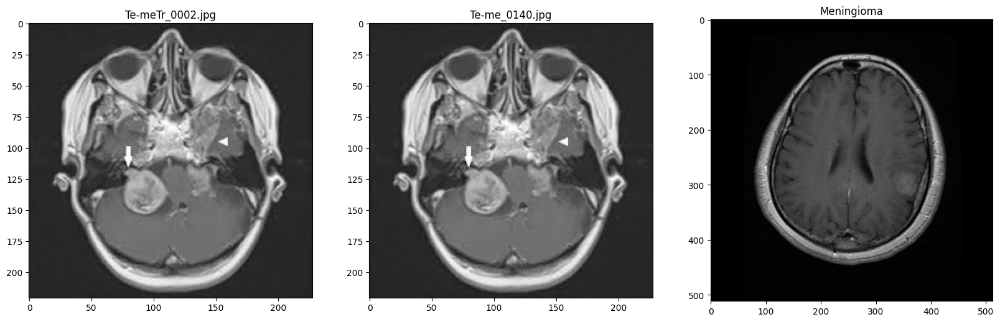

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/meningioma")
plt.title('Meningioma')

Text(0.5, 1.0, 'No Tumor')

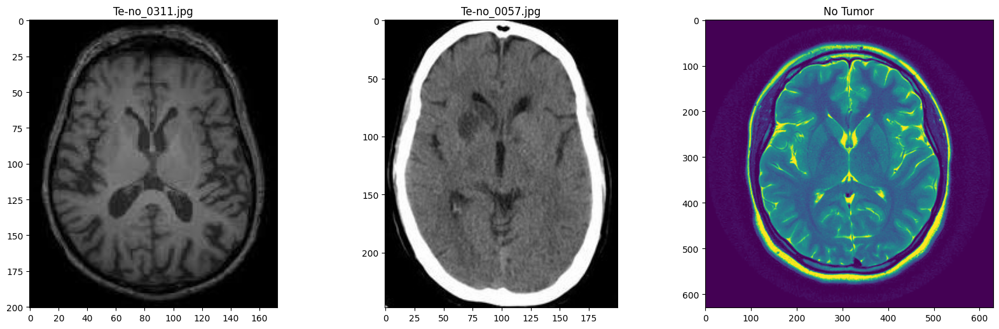

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/notumor")
plt.title('No Tumor')

Text(0.5, 1.0, 'Pituitary')

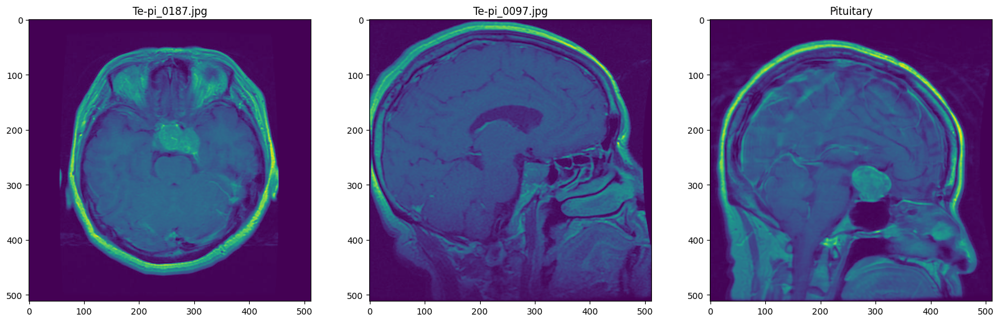

In [ ]:
get_folder("/content/drive/MyDrive/Dataset/Testing/pituitary")
plt.title('Pituitary')

Run again from here

In [15]:
test=data('/content/drive/MyDrive/Dataset/Testing')

In [16]:
train=data('/content/drive/MyDrive/Dataset/Training')

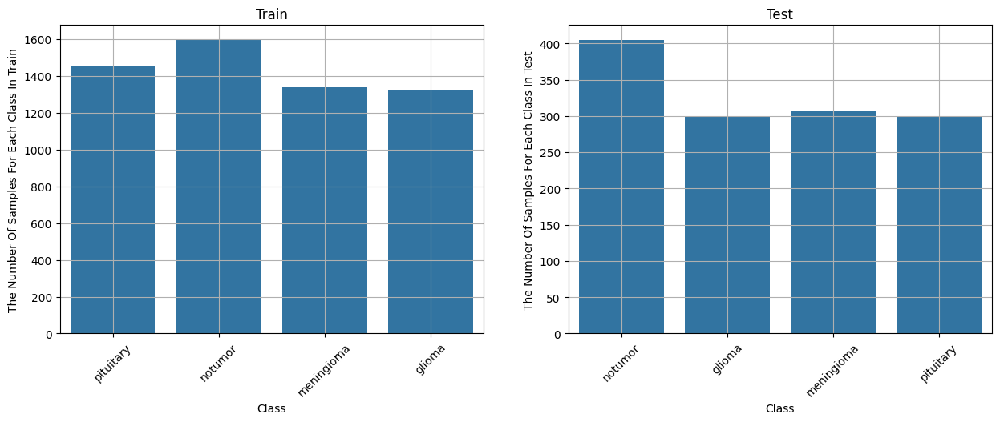

In [17]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.countplot(x=train.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,2,2)
ax = sns.countplot(x=test.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

**Preprocessing The Image**

In [18]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

x_train = [] # training images.
y_train  = [] # training labels.
x_test = [] # testing images.
y_test = [] # testing labels.

image_size = 224


for label in labels:
    trainPath = os.path.join(train_set,label)
    for file in tqdm(os.listdir(trainPath)):
        image = cv2.imread(os.path.join(trainPath, file),0)# load images in gray.
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50) # remove images noise.
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE) # produce a pseudocolored image.
        image = cv2.resize(image, (image_size, image_size)) # resize images into 224*224.

        x_train.append(image)
        y_train.append(labels.index(label))

    testPath = os.path.join(test_set,label)
    for file in tqdm(os.listdir(testPath)):
        image = cv2.imread(os.path.join(testPath, file),0)
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50)
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE)
        image = cv2.resize(image, (image_size, image_size))
        x_test.append(image)
        y_test.append(labels.index(label))

100%|██████████| 300/300 [00:08<00:00, 33.79it/s]


In [19]:
def crop_img(img):
	"""
	Finds the extreme points on the image and crops the rectangular out of them
	"""
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (3, 3), 0)

	# threshold the image, then perform a series of erosions +
	# dilations to remove any small regions of noise
	thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
	thresh = cv2.erode(thresh, None, iterations=2)
	thresh = cv2.dilate(thresh, None, iterations=2)

	# find contours in thresholded image, then grab the largest one
	cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)

	# find the extreme points
	extLeft = tuple(c[c[:, :, 0].argmin()][0])
	extRight = tuple(c[c[:, :, 0].argmax()][0])
	extTop = tuple(c[c[:, :, 1].argmin()][0])
	extBot = tuple(c[c[:, :, 1].argmax()][0])
	ADD_PIXELS = 0
	new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

	return new_img

if __name__ == "__main__":
	training = train_set
	testing = test_set
	training_dir = os.listdir(training)
	testing_dir = os.listdir(testing)
	IMG_SIZE = 224

	for dir in training_dir:
		save_path = 'cleaned/Training/'+ dir
		path = os.path.join(training,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

	for dir in testing_dir:
		save_path = 'cleaned/Testing/'+ dir
		path = os.path.join(testing,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

**Checking For Path Here We have 4 Labels**

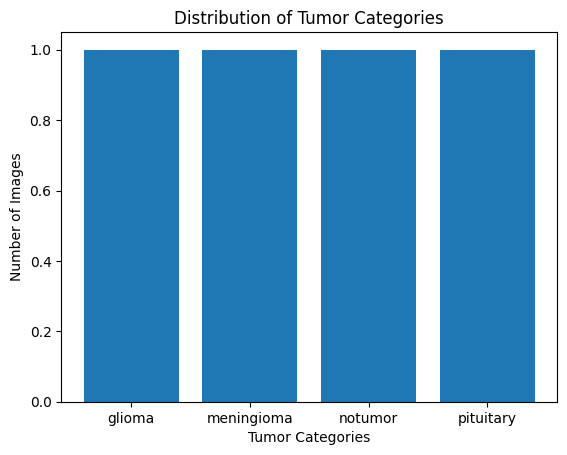

In [20]:
unique_labels, counts = np.unique(labels, return_counts=True)
plt.bar(unique_labels, counts)
plt.xlabel('Tumor Categories')
plt.ylabel('Number of Images')
plt.title('Distribution of Tumor Categories')
plt.show()

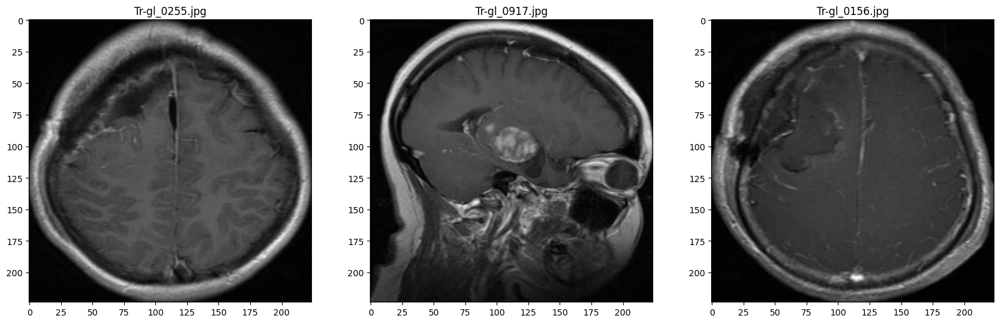

In [ ]:
get_folder("/content/cleaned/Training/glioma")

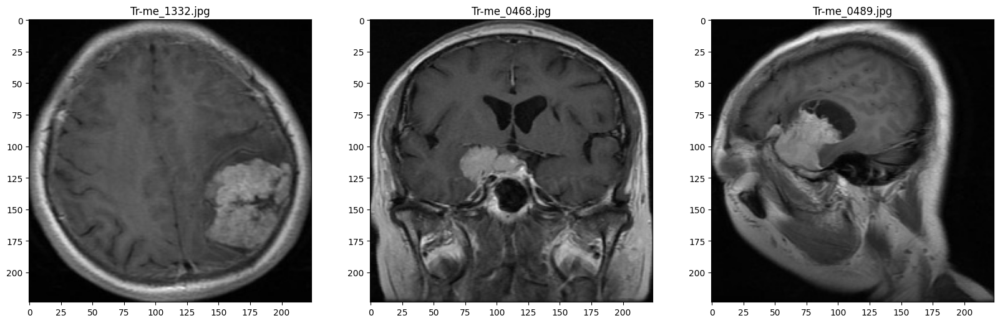

In [ ]:
get_folder("/content/cleaned/Training/meningioma")

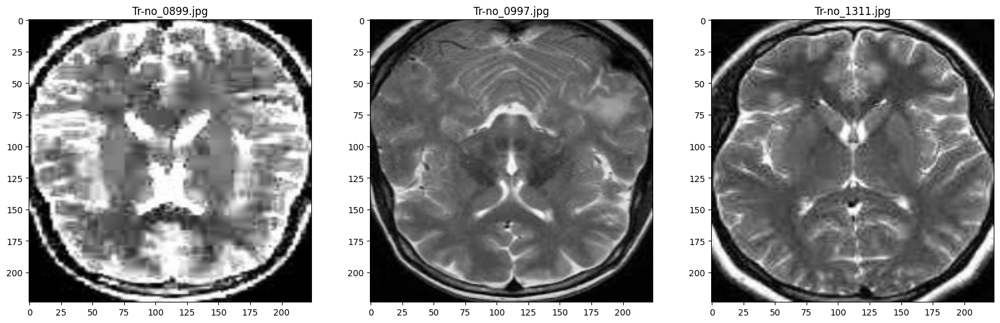

In [ ]:
get_folder("/content/cleaned/Training/notumor")

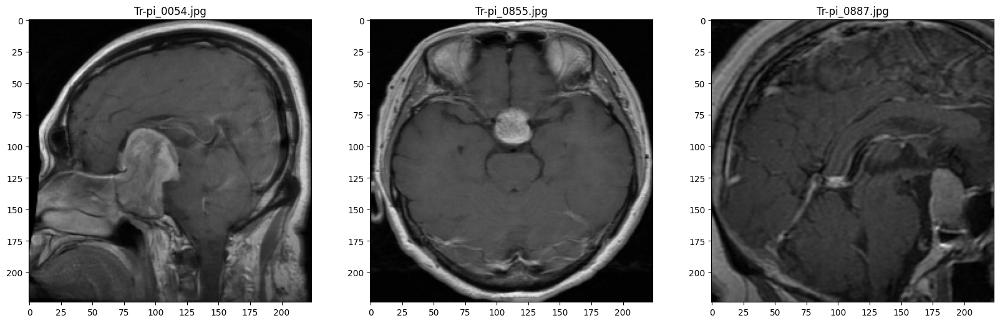

In [ ]:
get_folder("/content/cleaned/Training/pituitary")

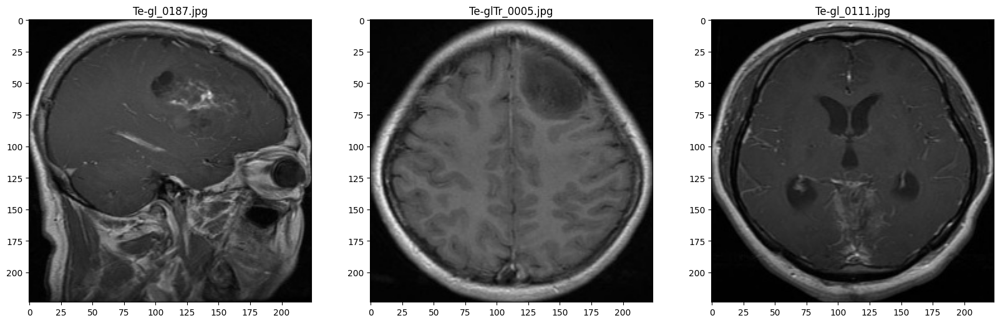

In [ ]:
get_folder("/content/cleaned/Testing/glioma")

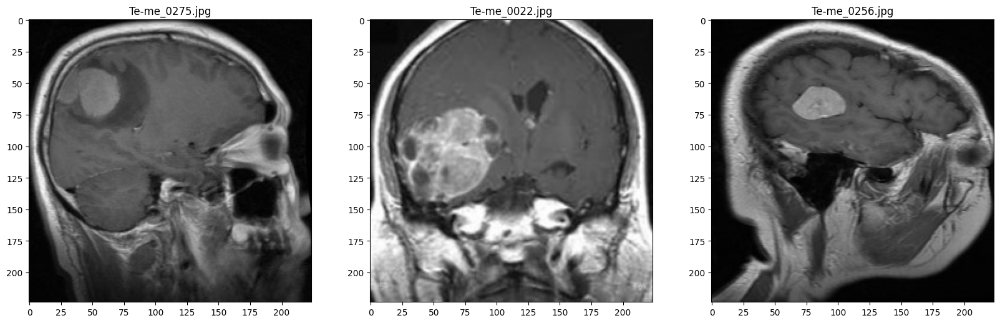

In [ ]:
get_folder("/content/cleaned/Testing/meningioma")

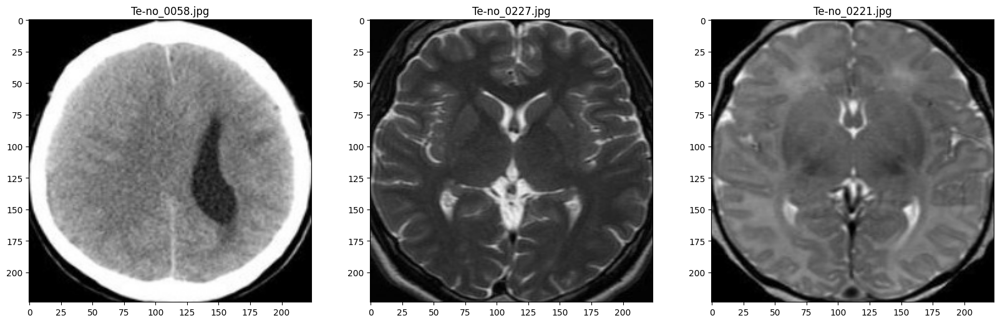

In [ ]:
get_folder("/content/cleaned/Testing/notumor")

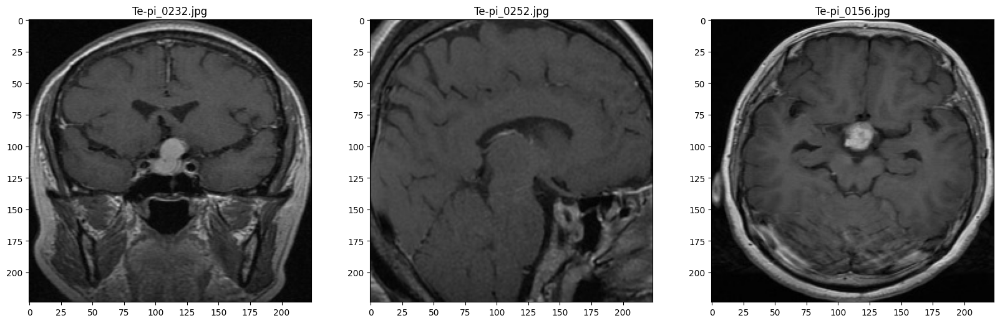

In [ ]:
get_folder("/content/cleaned/Testing/pituitary")

In [21]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/glioma',
 '/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/meningioma',
 '/content//cleaned/Training/notumor']

In [22]:
folders_test=glob('/content//cleaned/Testing/*')
folders_test

['/content//cleaned/Testing/glioma',
 '/content//cleaned/Testing/pituitary',
 '/content//cleaned/Testing/meningioma',
 '/content//cleaned/Testing/notumor']

In [23]:
len(folders_train)

4

**Training the Dataset**

In [24]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [25]:
prediction=Dense(4, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [26]:
model=Model(inception.input, prediction)
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,422,468 (9.24 MB)

 Trainable params: 164,484 (642.52 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [27]:
model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

**For Normalizing**

In [28]:
# train_datagen=ImageDataGenerator(rescale=1./255,
#                                  shear_range=0.2,
#                                  zoom_range=0.2,
#                                  horizontal_flip=False)

datagen = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
# test_datagen=ImageDataGenerator(rescale=1./255)


In [29]:
# train_set=train_datagen.flow_from_directory('/content//cleaned/Training',
#                                             target_size=(224,224),
#                                             batch_size=64,
#                                             class_mode='categorical'
#                                             )
train_set = datagen.flow_from_directory(
    '/content//cleaned/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 4571 images belonging to 4 classes.


**Creating Batches**

In [30]:
# test_set=test_datagen.flow_from_directory('/content//cleaned/Testing',
#                                             target_size=(224,224),
#                                             batch_size=64,
#                                             class_mode='categorical'
#                                             )

test_set = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleaned/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 1311 images belonging to 4 classes.


**Callback Function**

In [31]:
checkpoint_filepath = '/tmp/ckpt/checkpoint.weights.h5'
model_checkpoint_callback = keras.callbacks.ModelCheckpoint(
    filepath=checkpoint_filepath,
    save_weights_only=True,
    monitor='val_accuracy',
    mode='max',
    save_best_only=True)

In [32]:
callback =tf.keras.callbacks.BackupAndRestore(backup_dir="/tmp/backup")

In [33]:
early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10)

In [34]:
r=model.fit(train_set,validation_data=test_set,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


191/191 ━━━━━━━━━━━━━━━━━━━━ 110s 492ms/step - accuracy: 0.7275 - auc: 0.9094 - loss: 0.6840 - specificity_at_sensitivity: 0.9607 - val_accuracy: 0.8238 - val_auc: 0.9551 - val_loss: 0.5138 - val_specificity_at_sensitivity: 0.9875
Epoch 2/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 60s 303ms/step - accuracy: 0.8602 - auc: 0.9748 - loss: 0.3707 - specificity_at_sensitivity: 0.9958 - val_accuracy: 0.7788 - val_auc: 0.9484 - val_loss: 0.6146 - val_specificity_at_sensitivity: 0.9921
Epoch 3/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 59s 299ms/step - accuracy: 0.8689 - auc: 0.9799 - loss: 0.3316 - specificity_at_sensitivity: 0.9974 - val_accuracy: 0.8139 - val_auc: 0.9602 - val_loss: 0.5129 - val_specificity_at_sensitivity: 0.9942
Epoch 4/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 59s 303ms/step - accuracy: 0.8844 - auc: 0.9817 - loss: 0.3078 - specificity_at_sensitivity: 0.9968 - val_accuracy: 0.8101 - val_auc: 0.9629 - val_loss: 0.5053 - val_specificity_at_sensitivity: 0.9954
Epoch 5/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 59

**Checking The Results**

In [35]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
20,0.926493,0.992743,0.188475,0.999271,0.861175,0.975123,0.415395,0.997203
21,0.931962,0.993515,0.177551,0.999781,0.843631,0.973228,0.441966,0.997457
22,0.935244,0.994968,0.159111,1.000000,0.881007,0.981188,0.359970,0.997966
23,0.931087,0.993852,0.173667,0.999781,0.858124,0.977178,0.395000,0.997966
24,0.936994,0.994943,0.160391,0.999927,0.879481,0.981129,0.336153,0.998220


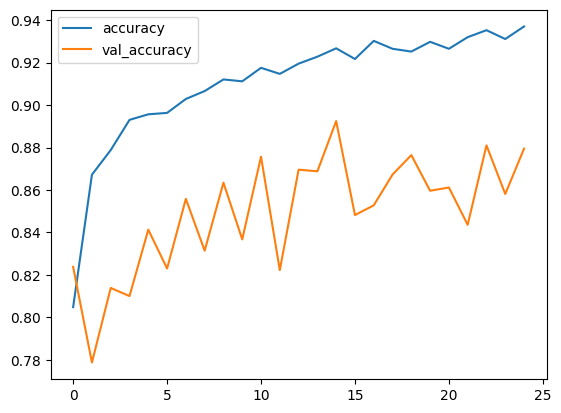

In [36]:
df_inception[["accuracy","val_accuracy"]].plot();

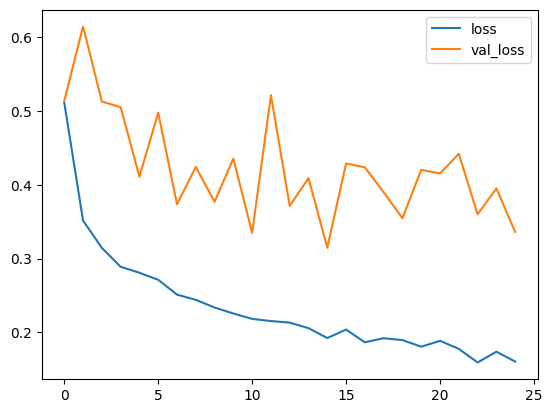

In [37]:
df_inception[["loss","val_loss"]].plot();

In [38]:
hist_=pd.DataFrame(r.history)
hist_


,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.804857,0.954599,0.511413,0.990812,0.823799,0.955126,0.513798,0.987541
1,0.867206,0.977190,0.351483,0.996354,0.778795,0.948422,0.614622,0.992118
2,0.878801,0.981892,0.314508,0.997521,0.813883,0.960210,0.512852,0.994152
3,0.893021,0.983924,0.288848,0.997812,0.810069,0.962886,0.505312,0.995423
4,0.895646,0.985060,0.280756,0.998542,0.841343,0.973139,0.411132,0.997457
5,0.896303,0.986188,0.271205,0.998906,0.823036,0.963330,0.497793,0.993644
6,0.902866,0.988020,0.251135,0.998979,0.855835,0.976482,0.373623,0.997457
7,0.906585,0.988545,0.244046,0.998906,0.831426,0.972072,0.424119,0.996186
8,0.912054,0.989259,0.233623,0.999271,0.863463,0.977419,0.377066,0.997203
9,0.911179,0.990425,0.225507,0.999562,0.836766,0.971831,0.435521,0.996695


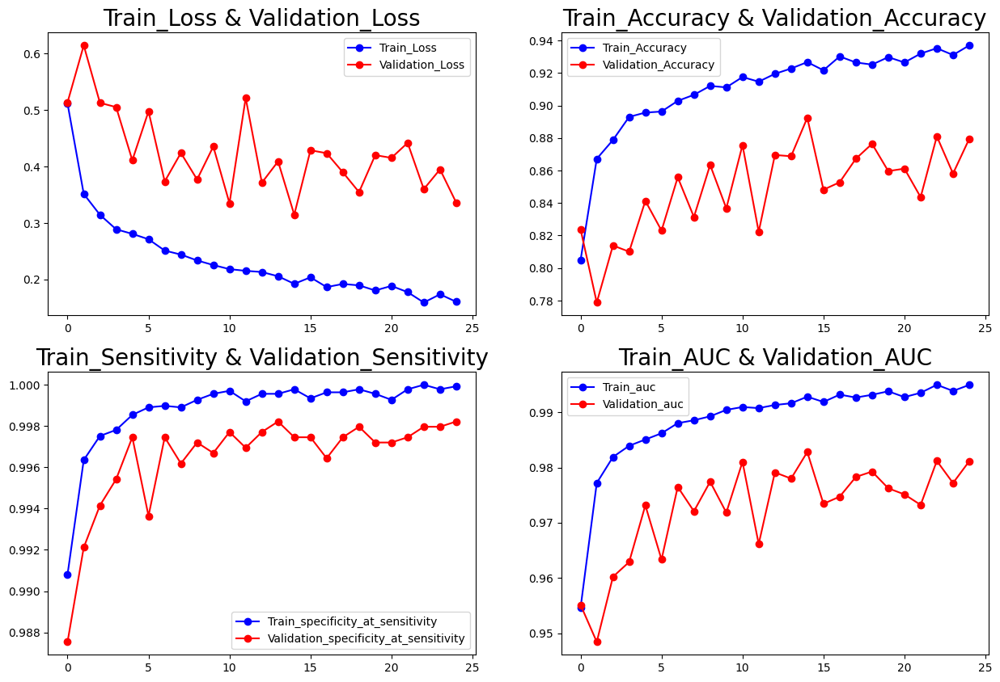

In [39]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [40]:
score, acc ,sensitivity,auc= model.evaluate(test_set)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

55/55 ━━━━━━━━━━━━━━━━━━━━ 2s 36ms/step - accuracy: 0.8337 - auc: 0.9683 - loss: 0.4326 - specificity_at_sensitivity: 0.9947
Test Loss = 0.33615273237228394
Test Accuracy = 0.879481315612793
Test Sensitivity = 0.9982202053070068
Test AUC = 0.9811291694641113


In [41]:
y_test =test_set.classes
predictions = model.predict(test_set)

# Find the class with the highest predicted probability for each sample
y_pred = np.argmax(predictions, axis=1)

y_test = np.ravel(y_test)
df = pd.DataFrame({'Actual': y_test, 'Prediction': y_pred})
print(df)

55/55 ━━━━━━━━━━━━━━━━━━━━ 8s 102ms/step
      Actual  Prediction
0          0           0
1          0           0
2          0           0
3          0           1
4          0           0
...      ...         ...
1306       3           3
1307       3           3
1308       3           3
1309       3           3
1310       3           3

[1311 rows x 2 columns]


array([[250,  37,   3,  10],
       [ 19, 209,  31,  47],
       [  3,   3, 397,   2],
       [  1,   1,   1, 297]])

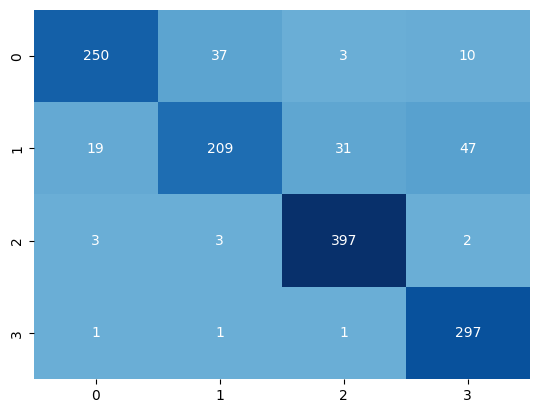

In [42]:
CM = confusion_matrix(y_test,y_pred)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [43]:
ClassificationReport = classification_report(y_test,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.92      0.83      0.87       300
           1       0.84      0.68      0.75       306
           2       0.92      0.98      0.95       405
           3       0.83      0.99      0.91       300

    accuracy                           0.88      1311
   macro avg       0.88      0.87      0.87      1311
weighted avg       0.88      0.88      0.88      1311



## **Just taking tumor categories**

In [ ]:
import shutil
import os

In [ ]:
drop=('/content//cleaned/Training/notumor')
shutil.rmtree(drop)

In [ ]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

['/content//cleaned/Training/glioma',
 '/content//cleaned/Training/pituitary',
 '/content//cleaned/Training/meningioma']

In [ ]:
shutil.rmtree('/content//cleaned/Testing/notumor')

In [ ]:
folders_test=glob('/content//cleaned/Testing/*')
folders_test

['/content//cleaned/Testing/glioma',
 '/content//cleaned/Testing/pituitary',
 '/content//cleaned/Testing/meningioma']

In [ ]:
len(folders_train)

3

In [ ]:
len(folders_test)

3

In [ ]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [ ]:
prediction=Dense(3, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [ ]:
model1=Model(inception.input, prediction)
model1.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,422,339 (9.24 MB)

 Trainable params: 164,355 (642.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
model1.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

In [ ]:
datagen1 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
train_set1 = datagen1.flow_from_directory(
    '/content//cleaned/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 3295 images belonging to 3 classes.


In [ ]:
test_set1 = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleaned/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 906 images belonging to 3 classes.


In [ ]:
r=model1.fit(train_set1,validation_data=test_set1,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


138/138 ━━━━━━━━━━━━━━━━━━━━ 80s 494ms/step - accuracy: 0.6617 - auc_1: 0.8270 - loss: 0.7888 - specificity_at_sensitivity_1: 0.8990 - val_accuracy: 0.7472 - val_auc_1: 0.9094 - val_loss: 0.6012 - val_specificity_at_sensitivity_1: 0.9691
Epoch 2/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 43s 297ms/step - accuracy: 0.8281 - auc_1: 0.9518 - loss: 0.4190 - specificity_at_sensitivity_1: 0.9889 - val_accuracy: 0.7627 - val_auc_1: 0.9194 - val_loss: 0.5915 - val_specificity_at_sensitivity_1: 0.9796
Epoch 3/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 80s 287ms/step - accuracy: 0.8381 - auc_1: 0.9549 - loss: 0.3992 - specificity_at_sensitivity_1: 0.9879 - val_accuracy: 0.7936 - val_auc_1: 0.9343 - val_loss: 0.5352 - val_specificity_at_sensitivity_1: 0.9857
Epoch 4/150
138/138 ━━━━━━━━━━━━━━━━━━━━ 83s 296ms/step - accuracy: 0.8720 - auc_1: 0.9689 - loss: 0.3306 - specificity_at_sensitivity_1: 0.9933 - val_accuracy: 0.8433 - val_auc_1: 0.9549 - val_loss: 0.4046 - val_specificity_at_sensitivity_1: 0.9906
Epoch 5/150


In [ ]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc_1,loss,specificity_at_sensitivity_1,val_accuracy,val_auc_1,val_loss,val_specificity_at_sensitivity_1
33,0.930197,0.989233,0.189564,0.999090,0.900662,0.972599,0.334165,0.995033
34,0.935964,0.991701,0.168577,0.999848,0.838852,0.954261,0.517896,0.995033
35,0.934446,0.990823,0.175455,0.999393,0.879691,0.967245,0.383072,0.993929
36,0.935660,0.991372,0.171281,0.999393,0.850993,0.957506,0.495510,0.995585
37,0.936571,0.990891,0.175410,0.999241,0.847682,0.954327,0.501740,0.995585


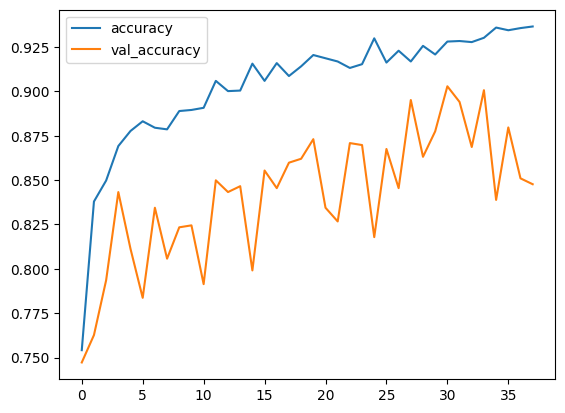

In [ ]:
df_inception[["accuracy","val_accuracy"]].plot();

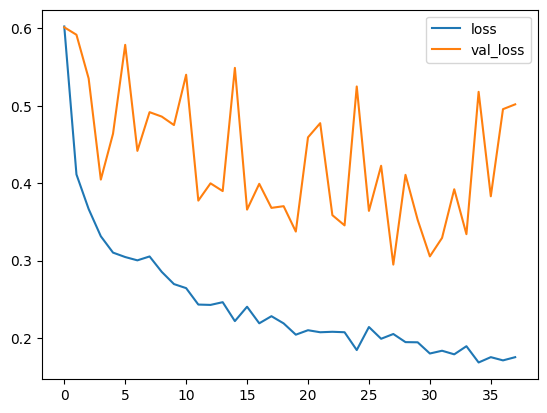

In [ ]:
df_inception[["loss","val_loss"]].plot();

In [ ]:
hist_=pd.DataFrame(r.history)
hist_

,accuracy,auc_1,loss,specificity_at_sensitivity_1,val_accuracy,val_auc_1,val_loss,val_specificity_at_sensitivity_1
0,0.754173,0.903047,0.602237,0.967982,0.747241,0.909413,0.601192,0.969095
1,0.837936,0.953261,0.411292,0.988164,0.762693,0.919426,0.591547,0.979581
2,0.849772,0.962318,0.366655,0.991806,0.793598,0.934298,0.535185,0.985651
3,0.869196,0.968867,0.331463,0.994841,0.843267,0.954919,0.404622,0.990618
4,0.877693,0.973007,0.310378,0.996206,0.811258,0.945919,0.463790,0.988962
5,0.883156,0.973822,0.304665,0.995903,0.783664,0.926760,0.578529,0.981788
6,0.879514,0.974340,0.300386,0.995751,0.834437,0.951712,0.441669,0.989514
7,0.878604,0.973627,0.305417,0.995903,0.805740,0.943314,0.491640,0.990066
8,0.888923,0.977193,0.285489,0.997117,0.823400,0.947180,0.485931,0.988411
9,0.889530,0.979126,0.269762,0.997269,0.824503,0.948497,0.475014,0.991722


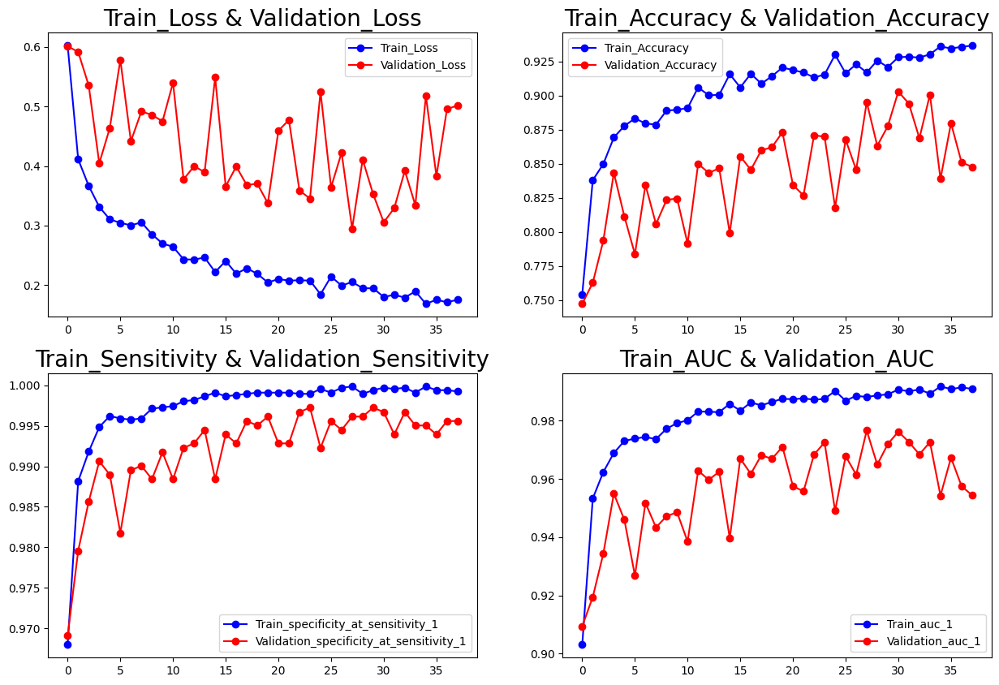

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity_1'],'b-o',label='Train_specificity_at_sensitivity_1')
plt.plot(hist_['val_specificity_at_sensitivity_1'],'r-o',label='Validation_specificity_at_sensitivity_1')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc_1'],'b-o',label='Train_auc_1')
plt.plot(hist_['val_auc_1'],'r-o',label='Validation_auc_1')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score,acc,sensitivity,auc= model1.evaluate(test_set1)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

38/38 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step - accuracy: 0.8065 - auc_1: 0.9298 - loss: 0.6680 - specificity_at_sensitivity_1: 0.9880
Test Loss = 0.5017398595809937
Test Accuracy = 0.8476821184158325
Test Sensitivity = 0.9955849647521973
Test AUC = 0.9543271660804749


In [ ]:
y_test1 =test_set1.classes
predictions = model1.predict(test_set1)

# Find the class with the highest predicted probability for each sample
y_pred1 = np.argmax(predictions, axis=1)

y_test1 = np.ravel(y_test1)
df = pd.DataFrame({'Actual': y_test1, 'Prediction': y_pred1})
print(df)

38/38 ━━━━━━━━━━━━━━━━━━━━ 11s 164ms/step
     Actual  Prediction
0         0           0
1         0           0
2         0           0
3         0           1
4         0           1
..      ...         ...
901       2           2
902       2           2
903       2           2
904       2           2
905       2           2

[906 rows x 2 columns]


array([[225,  53,  22],
       [ 11, 247,  48],
       [  1,   3, 296]])

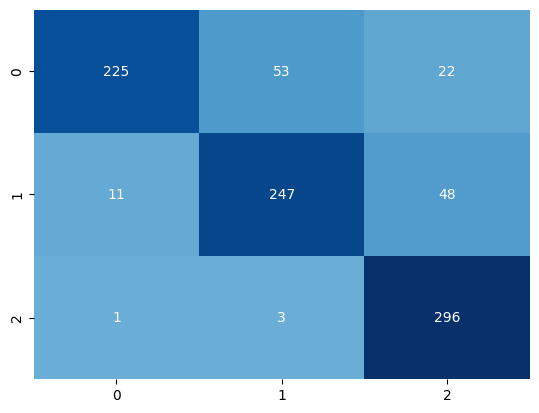

In [ ]:
CM = confusion_matrix(y_test1,y_pred1)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test1,y_pred1)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.95      0.75      0.84       300
           1       0.82      0.81      0.81       306
           2       0.81      0.99      0.89       300

    accuracy                           0.85       906
   macro avg       0.86      0.85      0.85       906
weighted avg       0.86      0.85      0.85       906



## **Now With just Tumor and No tumor Category**

In [ ]:
test_set2 = '/content/drive/MyDrive/Dataset/Testing'
train_set2='/content/drive/MyDrive/Dataset/Training'

In [ ]:
def data(dataset_path):
    images = []
    labels = []
    for subfolder in os.listdir(dataset_path):
        subfolder_path = os.path.join(dataset_path, subfolder)
        if not os.path.isdir(subfolder_path):
            continue
        for image_filename in os.listdir(subfolder_path):
            if image_filename.endswith(".jpg"):
                image_path = os.path.join(subfolder_path, image_filename)
                images.append(image_path)
                labels.append(subfolder)
    df = pd.DataFrame({'image': images, 'label': labels})
    return df

In [ ]:
test2=data('/content/drive/MyDrive/Dataset/Testing')

In [ ]:
train2=data('/content/drive/MyDrive/Dataset/Training')

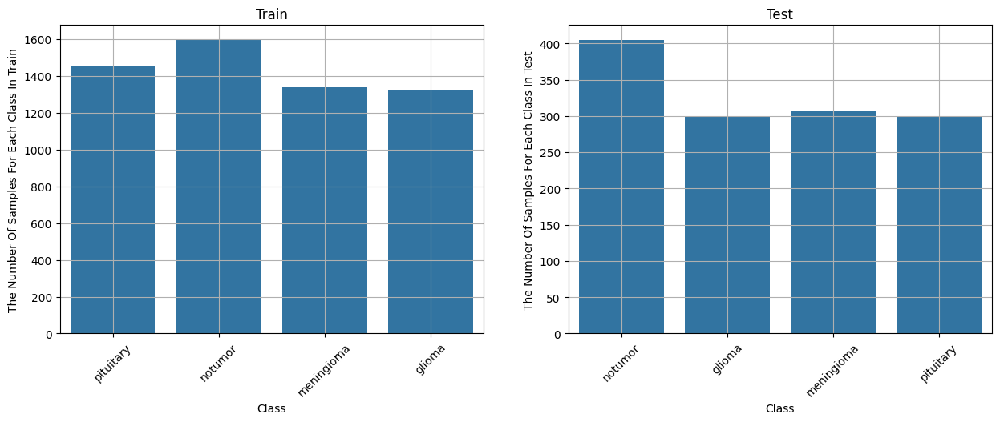

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
ax = sns.countplot(x=train2.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Train")
plt.title('Train')
plt.grid(True)
plt.xticks(rotation=45)
plt.subplot(1,2,2)
ax = sns.countplot(x=test2.label)
ax.set_xlabel("Class")
ax.set_ylabel("The Number Of Samples For Each Class In Test")
plt.title('Test')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

In [ ]:
labels = ['glioma', 'meningioma', 'notumor', 'pituitary']

x_train = [] # training images.
y_train  = [] # training labels.
x_test = [] # testing images.
y_test = [] # testing labels.

image_size = 224


for label in labels:
    trainPath = os.path.join(train_set2,label)
    for file in tqdm(os.listdir(trainPath)):
        image = cv2.imread(os.path.join(trainPath, file),0)# load images in gray.
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50) # remove images noise.
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE) # produce a pseudocolored image.
        image = cv2.resize(image, (image_size, image_size)) # resize images into 224*224.

        x_train.append(image)
        y_train.append(labels.index(label))

    testPath = os.path.join(test_set2,label)
    for file in tqdm(os.listdir(testPath)):
        image = cv2.imread(os.path.join(testPath, file),0)
        image = Image.fromarray(image)# Convert the image to a PIL image.
        contrast = ImageEnhance.Contrast(image)  # improving contrast
        image = contrast.enhance(1.2)
        brightness = ImageEnhance.Brightness(image)  # improving brightness
        image = brightness.enhance(1.1)
        sharpness = ImageEnhance.Sharpness(image)  # improving Sharpness
        image = sharpness.enhance(1.2)
        image = np.array(image)
        image = cv2.bilateralFilter(image, 2, 50, 50)
        image = cv2.applyColorMap(image, cv2.COLORMAP_BONE)
        image = cv2.resize(image, (image_size, image_size))
        x_test.append(image)
        y_test.append(labels.index(label))

100%|██████████| 300/300 [00:07<00:00, 37.81it/s]


In [ ]:
def crop_img(img):
	"""
	Finds the extreme points on the image and crops the rectangular out of them
	"""
	gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
	gray = cv2.GaussianBlur(gray, (3, 3), 0)

	# threshold the image, then perform a series of erosions +
	# dilations to remove any small regions of noise
	thresh = cv2.threshold(gray, 45, 255, cv2.THRESH_BINARY)[1]
	thresh = cv2.erode(thresh, None, iterations=2)
	thresh = cv2.dilate(thresh, None, iterations=2)

	# find contours in thresholded image, then grab the largest one
	cnts = cv2.findContours(thresh.copy(), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
	cnts = imutils.grab_contours(cnts)
	c = max(cnts, key=cv2.contourArea)

	# find the extreme points
	extLeft = tuple(c[c[:, :, 0].argmin()][0])
	extRight = tuple(c[c[:, :, 0].argmax()][0])
	extTop = tuple(c[c[:, :, 1].argmin()][0])
	extBot = tuple(c[c[:, :, 1].argmax()][0])
	ADD_PIXELS = 0
	new_img = img[extTop[1]-ADD_PIXELS:extBot[1]+ADD_PIXELS, extLeft[0]-ADD_PIXELS:extRight[0]+ADD_PIXELS].copy()

	return new_img

if __name__ == "__main__":
	training = train_set2
	testing = test_set2
	training_dir = os.listdir(training)
	testing_dir = os.listdir(testing)
	IMG_SIZE = 224

	for dir in training_dir:
		save_path = 'cleanedagain/Training/'+ dir
		path = os.path.join(training,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

	for dir in testing_dir:
		save_path = 'cleanedagain/Testing/'+ dir
		path = os.path.join(testing,dir)
		image_dir = os.listdir(path)
		for img in image_dir:
			image = cv2.imread(os.path.join(path,img))
			new_img = crop_img(image)
			new_img = cv2.resize(new_img,(IMG_SIZE,IMG_SIZE))
			if not os.path.exists(save_path):
				os.makedirs(save_path)
			cv2.imwrite(save_path+'/'+img, new_img)

In [ ]:
folders_train=glob('/content//cleanedagain/Training/*')
folders_train

['/content//cleanedagain/Training/glioma',
 '/content//cleanedagain/Training/pituitary',
 '/content//cleanedagain/Training/meningioma',
 '/content//cleanedagain/Training/notumor']

In [ ]:
folders_test=glob('/content//cleanedagain/Testing/*')
folders_test

['/content//cleanedagain/Testing/glioma',
 '/content//cleanedagain/Testing/pituitary',
 '/content//cleanedagain/Testing/meningioma',
 '/content//cleanedagain/Testing/notumor']

In [ ]:
import os
import shutil

# Path to your training directory
train_dir =('/content/cleanedagain/Training')

# Names of the categories you want to merge
categories_to_merge = ['glioma', 'meningioma', 'pituitary']  # Replace with your actual category names

# Name of the new merged category
merged_category_name = 'tumor'

# Create the new merged category folder
merged_category_path = os.path.join(train_dir, merged_category_name)
os.makedirs(merged_category_path, exist_ok=True)  # Create if it doesn't exist

# Move images from the three categories to the merged folder
for category in categories_to_merge:
    category_path = os.path.join(train_dir, category)
    for image_file in os.listdir(category_path):
        source_path = os.path.join(category_path, image_file)
        destination_path = os.path.join(merged_category_path, image_file)
        shutil.move(source_path, destination_path)  # Move the image


In [ ]:
import os
import shutil

# Path to your training directory
test_dir =('/content/cleanedagain/Testing')

# Names of the categories you want to merge
categories_to_merge = ['glioma', 'meningioma', 'pituitary']  # Replace with your actual category names

# Name of the new merged category
merged_category_name = 'tumor'

# Create the new merged category folder
merged_category_path = os.path.join(test_dir, merged_category_name)
os.makedirs(merged_category_path, exist_ok=True)  # Create if it doesn't exist

# Move images from the three categories to the merged folder
for category in categories_to_merge:
    category_path = os.path.join(test_dir, category)
    for image_file in os.listdir(category_path):
        source_path = os.path.join(category_path, image_file)
        destination_path = os.path.join(merged_category_path, image_file)
        shutil.move(source_path, destination_path)  # Move the image

In [ ]:
drop=('/content//cleanedagain/Training/pituitary')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Training/glioma')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Training/meningioma')
shutil.rmtree(drop)

In [ ]:
folders_train=glob('/content//cleaned/Training/*')
folders_train

[]

In [ ]:
drop=('/content//cleanedagain/Testing/pituitary')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Testing/glioma')
shutil.rmtree(drop)

In [ ]:
drop=('/content//cleanedagain/Testing/meningioma')
shutil.rmtree(drop)

In [ ]:
folders_test=glob('/content//cleanedagain/Testing/*')
folders_test

['/content//cleanedagain/Testing/notumor',
 '/content//cleanedagain/Testing/tumor']

In [ ]:
x= tf.keras.layers.GlobalAveragePooling2D()(inception.output)
x= Dense(128,activation='relu')(x)
x= Dropout(0.2)(x)

In [ ]:
prediction=Dense(2, activation='softmax')(x)

inception.input

<KerasTensor shape=(None, 224, 224, 3), dtype=float32, sparse=None, name=keras_tensor>

In [ ]:
model2=Model(inception.input, prediction)
model2.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 224, 224, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1 (Conv2D)            │ (None, 112, 112, 32)   │            864 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ bn_Conv1                  │ (None, 112, 112, 32)   │            128 │ Conv1[0][0]            │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ Conv1_relu (ReLU)         │ (None, 112, 112, 32)   │              0 │ bn_Conv1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise   │ (None, 112, 112, 32)   │            288 │ Conv1_relu[0][0]       │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │            128 │ expanded_conv_depthwi… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_depthwise_… │ (None, 112, 112, 32)   │              0 │ expanded_conv_depthwi… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project     │ (None, 112, 112, 16)   │            512 │ expanded_conv_depthwi… │
│ (Conv2D)                  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ expanded_conv_project_BN  │ (None, 112, 112, 16)   │             64 │ expanded_conv_project… │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand (Conv2D)   │ (None, 112, 112, 96)   │          1,536 │ expanded_conv_project… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_BN         │ (None, 112, 112, 96)   │            384 │ block_1_expand[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_expand_relu       │ (None, 112, 112, 96)   │              0 │ block_1_expand_BN[0][… │
│ (ReLU)                    │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_pad               │ (None, 113, 113, 96)   │              0 │ block_1_expand_relu[0… │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise         │ (None, 56, 56, 96)     │            864 │ block_1_pad[0][0]      │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block_1_depthwise_BN 

 Total params: 2,422,210 (9.24 MB)

 Trainable params: 164,226 (641.51 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

In [ ]:
model2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy', keras.metrics.SpecificityAtSensitivity(0.5), keras.metrics.AUC()])

In [ ]:
datagen1 = ImageDataGenerator(
    rescale=1./255,
    validation_split=0.2,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)


In [ ]:
train_set2 = datagen1.flow_from_directory(
    '/content//cleanedagain/Training',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    subset='training'
)

Found 4570 images belonging to 2 classes.


In [ ]:
test_set2 = ImageDataGenerator(rescale=1./255).flow_from_directory(
    '/content//cleanedagain/Testing',
    target_size=(224, 224),
    batch_size=24,
    class_mode='categorical',
    shuffle=False
)

Found 1311 images belonging to 2 classes.


In [ ]:
r=model2.fit(train_set2,validation_data=test_set2,
                      epochs=150,
                      callbacks=[early_stop,callback,model_checkpoint_callback])

Epoch 1/150


/usr/local/lib/python3.10/dist-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


191/191 ━━━━━━━━━━━━━━━━━━━━ 105s 465ms/step - accuracy: 0.9401 - auc: 0.9777 - loss: 0.1686 - specificity_at_sensitivity: 0.9934 - val_accuracy: 0.9580 - val_auc: 0.9917 - val_loss: 0.1131 - val_specificity_at_sensitivity: 0.9992
Epoch 2/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 59s 298ms/step - accuracy: 0.9791 - auc: 0.9966 - loss: 0.0604 - specificity_at_sensitivity: 0.9987 - val_accuracy: 0.9641 - val_auc: 0.9931 - val_loss: 0.1025 - val_specificity_at_sensitivity: 0.9992
Epoch 3/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 81s 296ms/step - accuracy: 0.9803 - auc: 0.9970 - loss: 0.0599 - specificity_at_sensitivity: 0.9993 - val_accuracy: 0.9641 - val_auc: 0.9949 - val_loss: 0.0953 - val_specificity_at_sensitivity: 0.9992
Epoch 4/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 57s 292ms/step - accuracy: 0.9820 - auc: 0.9982 - loss: 0.0468 - specificity_at_sensitivity: 0.9994 - val_accuracy: 0.9664 - val_auc: 0.9955 - val_loss: 0.0966 - val_specificity_at_sensitivity: 0.9992
Epoch 5/150
191/191 ━━━━━━━━━━━━━━━━━━━━ 82

In [ ]:
df_inception = pd.DataFrame(r.history)
df_inception.tail()

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
36,0.994530,0.999669,0.014379,0.999781,0.985507,0.994151,0.071388,0.994661
37,0.995624,0.999919,0.011397,1.000000,0.987033,0.994928,0.064027,0.995423
38,0.994530,0.999657,0.014764,0.999781,0.986270,0.995715,0.056982,0.996186
39,0.994311,0.999178,0.018230,0.999344,0.988558,0.995011,0.054041,0.995423
40,0.992998,0.999652,0.015465,0.999781,0.988558,0.995750,0.052980,0.996186


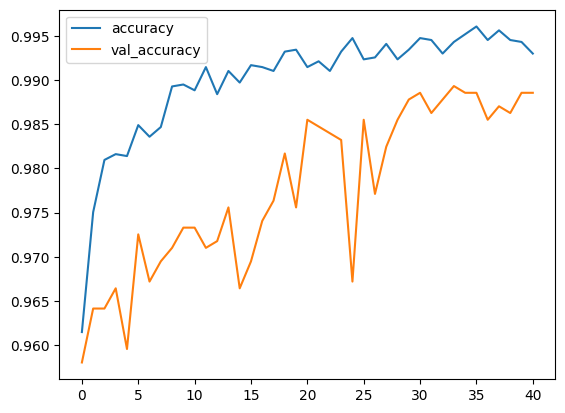

In [ ]:
df_inception[["accuracy","val_accuracy"]].plot();

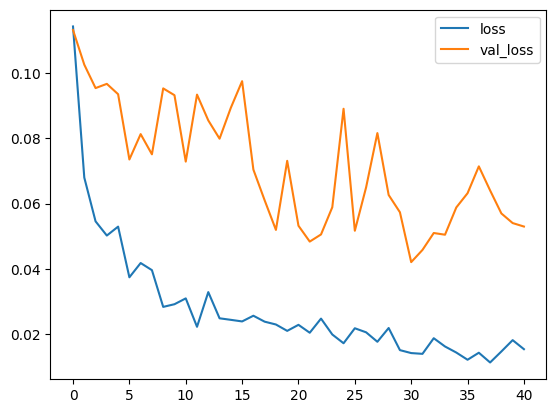

In [ ]:
df_inception[["loss","val_loss"]].plot();

In [ ]:
hist_=pd.DataFrame(r.history)
hist_

,accuracy,auc,loss,specificity_at_sensitivity,val_accuracy,val_auc,val_loss,val_specificity_at_sensitivity
0,0.961488,0.990681,0.114177,0.997812,0.958047,0.991708,0.113084,0.999237
1,0.975055,0.996249,0.067953,0.998906,0.964149,0.993131,0.102495,0.999237
2,0.980963,0.997353,0.054571,0.999125,0.964149,0.994936,0.095333,0.999237
3,0.981619,0.997795,0.050224,0.999125,0.966438,0.995483,0.096623,0.999237
4,0.981400,0.997903,0.052952,0.999562,0.959573,0.995640,0.093457,1.000000
5,0.984902,0.999137,0.037452,1.000000,0.972540,0.997170,0.073492,1.000000
6,0.983589,0.998635,0.041817,0.999562,0.967201,0.996721,0.081252,1.000000
7,0.984683,0.998644,0.039642,0.999562,0.969489,0.997215,0.075073,1.000000
8,0.989278,0.999279,0.028400,0.999781,0.971014,0.996524,0.095236,0.999237
9,0.989497,0.999258,0.029218,0.999781,0.973303,0.994639,0.093155,0.996949


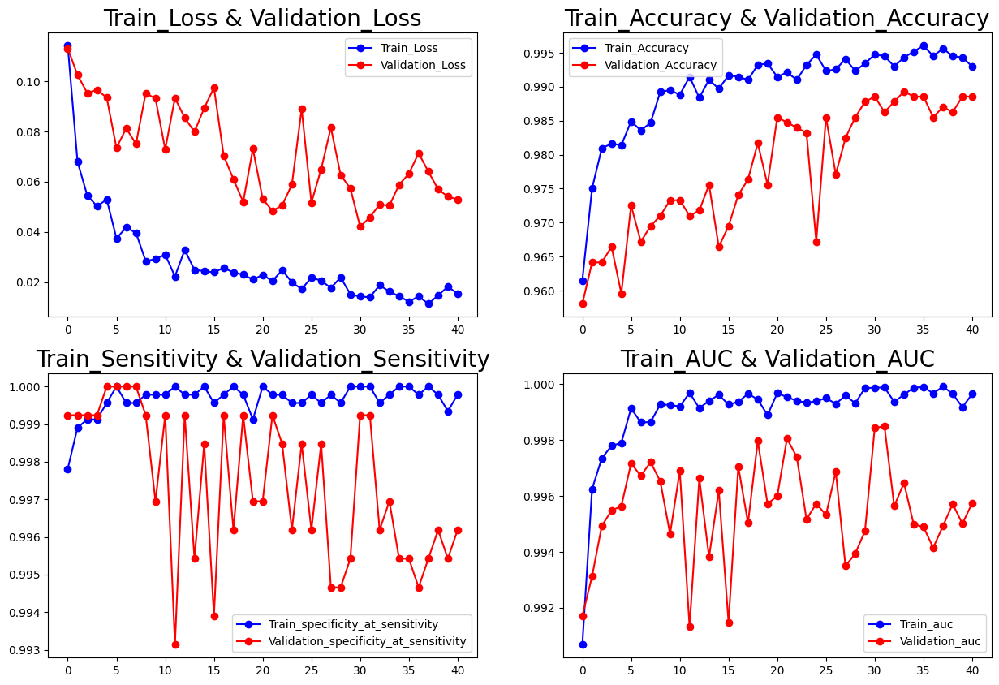

In [ ]:
plt.figure(figsize=(15,10))
plt.subplot(2,2,1)
plt.plot(hist_['loss'],'b-o',label='Train_Loss')
plt.plot(hist_['val_loss'],'r-o',label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(2,2,2)
plt.plot(hist_['accuracy'],'b-o',label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],'r-o',label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()
plt.subplot(2,2,3)
plt.plot(hist_['specificity_at_sensitivity'],'b-o',label='Train_specificity_at_sensitivity')
plt.plot(hist_['val_specificity_at_sensitivity'],'r-o',label='Validation_specificity_at_sensitivity')
plt.title('Train_Sensitivity & Validation_Sensitivity',fontsize=20)
plt.legend()
plt.subplot(2,2,4)
plt.plot(hist_['auc'],'b-o',label='Train_auc')
plt.plot(hist_['val_auc'],'r-o',label='Validation_auc')
plt.title('Train_AUC & Validation_AUC',fontsize=20)
plt.legend()
plt.show()

In [ ]:
score,acc,sensitivity,auc= model2.evaluate(test_set2)
print('Test Loss =', score)
print('Test Accuracy =', acc)
print('Test Sensitivity =', sensitivity)
print('Test AUC =', auc)

55/55 ━━━━━━━━━━━━━━━━━━━━ 3s 50ms/step - accuracy: 0.9700 - auc: 0.9848 - loss: 0.1475 - specificity_at_sensitivity: 0.9881
Test Loss = 0.05297954007983208
Test Accuracy = 0.9885583519935608
Test Sensitivity = 0.9961861371994019
Test AUC = 0.9957500696182251


In [ ]:
y_test2 =test_set2.classes
predictions = model2.predict(test_set2)

# Find the class with the highest predicted probability for each sample
y_pred2 = np.argmax(predictions, axis=1)

y_test2 = np.ravel(y_test2)
df = pd.DataFrame({'Actual': y_test2, 'Prediction': y_pred2})
print(df)

55/55 ━━━━━━━━━━━━━━━━━━━━ 7s 79ms/step
      Actual  Prediction
0          0           1
1          0           0
2          0           0
3          0           0
4          0           1
...      ...         ...
1306       1           1
1307       1           1
1308       1           1
1309       1           1
1310       1           1

[1311 rows x 2 columns]


In [ ]:


 y_test2[100]


0

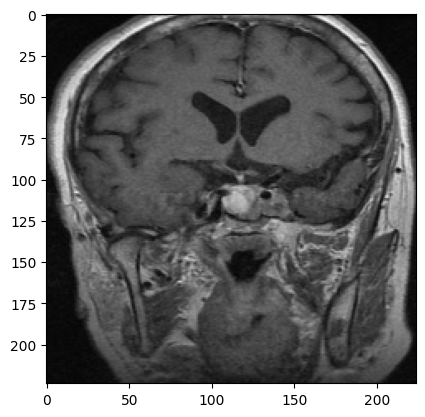

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the dataset to access the 100th image
i = 0
for image, label in test_set2:
    if i == 100:
        plt.imshow(image[0])  # Assuming image is in a batch format
        plt.show()
        break
    i += 1

In [ ]:
y_pred2[100]

0

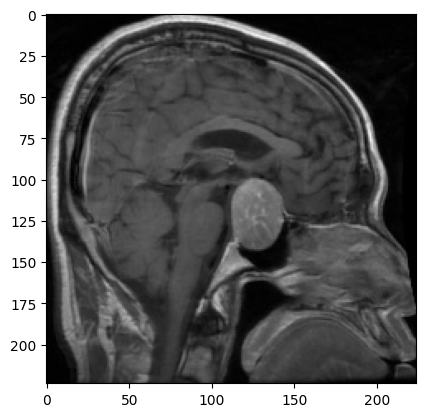

In [ ]:
import matplotlib.pyplot as plt

# Iterate through the dataset to access the 100th image
i = 0
for image, label in test_set2:
    if i == 0:
        plt.imshow(image[0])  # Assuming image is in a batch format
        plt.show()
        break
    i += 1

In [ ]:
y_pred2[0]

1

array([[395,  10],
       [  5, 901]])

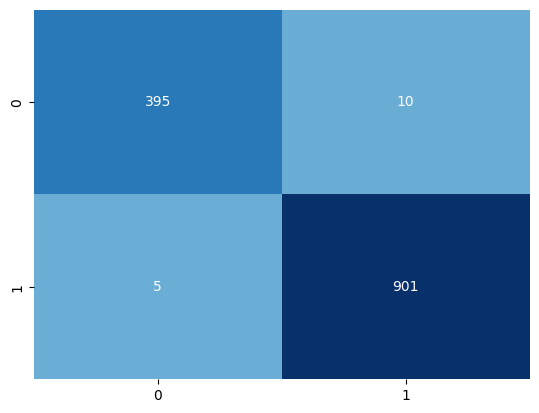

In [ ]:
CM = confusion_matrix(y_test2,y_pred2)
sns.heatmap(CM,fmt='g',center = True,cbar=False,annot=True,cmap='Blues')
CM

In [ ]:
ClassificationReport = classification_report(y_test2,y_pred2)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.99      0.98      0.98       405
           1       0.99      0.99      0.99       906

    accuracy                           0.99      1311
   macro avg       0.99      0.98      0.99      1311
weighted avg       0.99      0.99      0.99      1311

